In [ ]:
# Installing the dataset - Need kaggle.json file
#!pip install kaggle
#! mkdir ~/.kaggle
#! cp kaggle.json ~/.kaggle/
#! chmod 600 ~/.kaggle/kaggle.json
#! kaggle datasets download chrisfilo/fruit-recognition
#! unzip fruit-recognition.zip -d archive -p
#! mkdir archive
#! unzip fruit-recognition.zip -d archive

In [ ]:
# Required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import cv2 as cv
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
import imgaug.augmenters as iaa

In [ ]:
np.random.seed(1) # Add random seed of training for reproducibility

# Read images from folder
def load_images_from_folder(folder,only_path = False, label = ""):
    if only_path == False:
        images = []
        for filename in os.listdir(folder):
            img = plt.imread(os.path.join(folder,filename))
            if img is not None:
                images.append(img)
        return images
    else:
        path = []
        for filename in os.listdir(folder):
            img_path = os.path.join(folder,filename)
            if img_path is not None:
                path.append([label,img_path])
        return path

In [ ]:
# Get images from every folder
images = []
dirp = "/content/archive/"
for f in os.listdir(dirp):
    if "png" in os.listdir(dirp+f)[0]:
        images += load_images_from_folder(dirp+f,True,label = f)
    else: 
        for d in os.listdir(dirp+f):
            images += load_images_from_folder(dirp+f+"//"+d,True,label = f)
            
img_df = pd.DataFrame(images, columns = ["Type", "Filepath"])

from sklearn.utils import shuffle
# Shuffling the data and their indexes
img_df = shuffle(img_df, random_state = 0)
img_df = img_df.reset_index(drop=True)

# Each fruit type gets a unique number
fruit_names = sorted(img_df.Type.unique()) #sorts this list of unique fruit names in alphabetical order and assigns it to the variable fruit_names
mapper_fruit_names = dict(zip(fruit_names, [t for t in range(len(fruit_names))]))
img_df["label"] = img_df["Type"].map(mapper_fruit_names)
print(mapper_fruit_names)

img_df


{'Apple': 0, 'Banana': 1, 'Carambola': 2, 'Guava': 3, 'Kiwi': 4, 'Mango': 5, 'Orange': 6, 'Peach': 7, 'Pear': 8, 'Persimmon': 9, 'Pitaya': 10, 'Plum': 11, 'Pomegranate': 12, 'Tomatoes': 13, 'muskmelon': 14}


,Type,Filepath,label
0,Orange,/content/archive/Orange/Orange002446.png,6
1,Orange,/content/archive/Orange/Orange001666.png,6
2,Apple,/content/archive/Apple//Apple F/Apple F _0_461...,0
3,Mango,/content/archive/Mango/Mango001937.png,5
4,Peach,/content/archive/Peach/Peach00611.png,7
...,...,...,...
70544,Guava,/content/archive/Guava//Guava total/GuavaуАВ12...,3
70545,Apple,/content/archive/Apple//Apple C/Apple Ce03061.png,0
70546,Apple,/content/archive/Apple//Apple E/Apple E58.png,0
70547,Apple,/content/archive/Apple//Apple F/scene07861.png,0


In [ ]:
# Train + validation dataset
dataset = img_df.iloc[0:14109]
dataset

,Type,Filepath,label
0,Orange,/content/archive/Orange/Orange002446.png,6
1,Orange,/content/archive/Orange/Orange001666.png,6
2,Apple,/content/archive/Apple//Apple F/Apple F _0_461...,0
3,Mango,/content/archive/Mango/Mango001937.png,5
4,Peach,/content/archive/Peach/Peach00611.png,7
...,...,...,...
14104,Orange,/content/archive/Orange/Orange002675.png,6
14105,Guava,/content/archive/Guava//Guava total/1GuavaуАВ2...,3
14106,Guava,/content/archive/Guava//Guava total/GuavaуАВ71...,3
14107,Orange,/content/archive/Orange/Orange002153.png,6


In [ ]:
# Resize and flatten
def img_to_array(img_path):
    return cv2.resize(cv2.imread(img_path), (50, 50)).flatten()
    
dataset['pixel'] = dataset['Filepath'].apply(img_to_array)
dataset.head()

# Preparing X and Y
X = dataset['pixel']
Y = dataset['label']

# Train validation split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, train_size=0.8, stratify=Y, random_state=1)

# Test dataset
dataset_test = img_df.iloc[67013:70540]

dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)

X_test = dataset_test['pixel']
Y_test = dataset_test['label']

<ipython-input-6-60996a7205c1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['pixel'] = dataset['Filepath'].apply(img_to_array)
<ipython-input-6-60996a7205c1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)


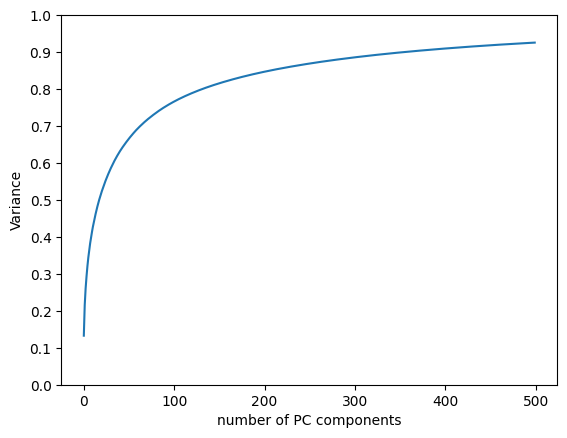

In [ ]:
#converts list of arrays into a single NumPy array with an additional dimension
# scaling is done to normalize the range of features so that they have similar magnitudes, which can help improve the performance
X_train = np.stack(X_train)
scaler = StandardScaler()
scaler.fit(X_train)
X_train_norm = scaler.transform(X_train)
X_test = scaler.transform(np.stack(X_test))

# Applying PCA
pca = PCA(n_components=500)
pca.fit(X_train)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of PC components')
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
plt.ylabel('Variance')
plt.show()

In [ ]:
# Applying PCA train and test datasets
XP_train = pca.transform(X_train_norm)
XP_test = pca.transform(X_test)
model = GaussianNB()

model.fit(XP_train, Y_train)
Ypred_test = model.predict(XP_test)

accuracy = accuracy_score(Y_test, Ypred_test)
print("Accuracy:", accuracy)


Accuracy: 0.5928551176637369


In [ ]:
# Fine tuning
labels = ['Apple', 'Banana', 'Carambola', 'Guava', 'Kiwi','Mango','Orange','Peach','Pear','Persimmon','Pitaya','Plum','Pomegranate','Tomatoes','Muskmelon']
    #if df.iloc[[0]]['label'] == 0:
    #print(df[df.columns[0]=='Apple'].count())
df = dataset
apple = df.loc[df['Type'] == 'Apple'].count().iloc[0]
banana = df.loc[df['Type'] == 'Banana'].count().iloc[0]
carambola = df.loc[df['Type'] == 'Carambola'].count().iloc[0]
guava = df.loc[df['Type'] == 'Guava'].count().iloc[0]
kiwi = df.loc[df['Type'] == 'Kiwi'].count().iloc[0]
mango = df.loc[df['Type'] == 'Mango'].count().iloc[0]
orange = df.loc[df['Type'] == 'Orange'].count().iloc[0]
peach = df.loc[df['Type'] == 'Peach'].count().iloc[0]
pear = df.loc[df['Type'] == 'Pear'].count().iloc[0]
persimmon = df.loc[df['Type'] == 'Persimmon'].count().iloc[0]
itaya = df.loc[df['Type'] == 'Pitaya'].count().iloc[0]
plum = df.loc[df['Type'] == 'Plum'].count().iloc[0]
pomegranate = df.loc[df['Type'] == 'Pomegranate'].count().iloc[0]
tomatoes = df.loc[df['Type'] == 'Tomatoes'].count().iloc[0]
muskmelon = df.loc[df['Type'] == 'muskmelon'].count().iloc[0]

sizes = [apple, banana, carambola, guava, kiwi,mango,orange,peach,pear,persimmon,itaya,plum,pomegranate,tomatoes,muskmelon]

In [ ]:
# Alternative prior values
pri = []
d = len(dataset)
for i in sizes:
  pri.append(i/d)


In [ ]:
# Alternative another prior values
labels = ['Apple', 'Banana', 'Carambola', 'Guava', 'Kiwi','Mango','Orange','Peach','Pear','Persimmon','Pitaya','Plum','Pomegranate','Tomatoes','Muskmelon']
    #if df.iloc[[0]]['label'] == 0:
    #print(df[df.columns[0]=='Apple'].count())
df = img_df.iloc[14109:]
apple = df.loc[df['Type'] == 'Apple'].count().iloc[0]
banana = df.loc[df['Type'] == 'Banana'].count().iloc[0]
carambola = df.loc[df['Type'] == 'Carambola'].count().iloc[0]
guava = df.loc[df['Type'] == 'Guava'].count().iloc[0]
kiwi = df.loc[df['Type'] == 'Kiwi'].count().iloc[0]
mango = df.loc[df['Type'] == 'Mango'].count().iloc[0]
orange = df.loc[df['Type'] == 'Orange'].count().iloc[0]
peach = df.loc[df['Type'] == 'Peach'].count().iloc[0]
pear = df.loc[df['Type'] == 'Pear'].count().iloc[0]
persimmon = df.loc[df['Type'] == 'Persimmon'].count().iloc[0]
itaya = df.loc[df['Type'] == 'Pitaya'].count().iloc[0]
plum = df.loc[df['Type'] == 'Plum'].count().iloc[0]
pomegranate = df.loc[df['Type'] == 'Pomegranate'].count().iloc[0]
tomatoes = df.loc[df['Type'] == 'Tomatoes'].count().iloc[0]
muskmelon = df.loc[df['Type'] == 'muskmelon'].count().iloc[0]

sizes2 = [apple, banana, carambola, guava, kiwi,mango,orange,peach,pear,persimmon,itaya,plum,pomegranate,tomatoes,muskmelon]

In [ ]:
pri2=[]
d = len(df)
for i in sizes2:
  pri2.append(i/d)

pri2

[0.15740609496810773,
 0.042682494684620834,
 0.029447200566973777,
 0.2802267895109851,
 0.12026931254429482,
 0.05928419560595322,
 0.043302622253720766,
 0.037792345854004254,
 0.04238128986534373,
 0.02985471296952516,
 0.034975194897236,
 0.03258327427356485,
 0.030598866052445075,
 0.029890148830616584,
 0.02930545712260808]

In [ ]:
# Uniform prior
uni = []
for i in range(len(fruit_names)):
  uni.append(1/15)

In [ ]:
# Fine tuning 
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
shuffle_split = ShuffleSplit(n_splits=1, test_size=0.2)
# This is equivalent to: 
#   X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
# But, it is usable for GridSearchCV

# GridSearch without CV
#params = { 'n_estimators': [16, 32] }


params = {'var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5,
                            1e-4, 1e-3, 1e-2, 1e-1, 1,0,1e-05 ],
          'priors': [None, pri, pri2, uni] 
}
clf = GaussianNB()
grid_search = GridSearchCV(clf, param_grid=params, cv=shuffle_split)
grid_search.fit(XP_train, Y_train)
var_s = grid_search.best_estimator_.var_smoothing




In [ ]:
# Results of fine tuning
print(grid_search.best_estimator_.var_smoothing)
print(grid_search.best_estimator_.priors)

0.0001
None


In [ ]:
# Gaussian Naive Bayes Model
model2 = GaussianNB(var_smoothing=grid_search.best_estimator_.var_smoothing, priors=grid_search.best_estimator_.priors)

# Fitting the model
model2.fit(XP_train, Y_train)
Ypred_test = model2.predict(XP_test)

# Printing accuracy
accuracy = accuracy_score(Y_test, Ypred_test)
print("Accuracy:", accuracy)

Accuracy: 0.5922880635100652


In [ ]:
# Fine tuning parts result - Written to make a graph
sm = [ 0, 1e-8, 1e-7,1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1]
ac = []
for i in sm:
  model2 = GaussianNB(var_smoothing=i)

  model2.fit(XP_train, Y_train)
  pred = model2.predict(XP_test)
  accuracy = accuracy_score(Y_test, pred)
  ac.append(accuracy)
print("Accuracy:", ac)



Accuracy: [0.5928551176637369, 0.5928551176637369, 0.5928551176637369, 0.5934221718174085, 0.5934221718174085, 0.5922880635100652, 0.5494754749078536, 0.41593422171817407, 0.3407995463566771, 0.29515168698610716]


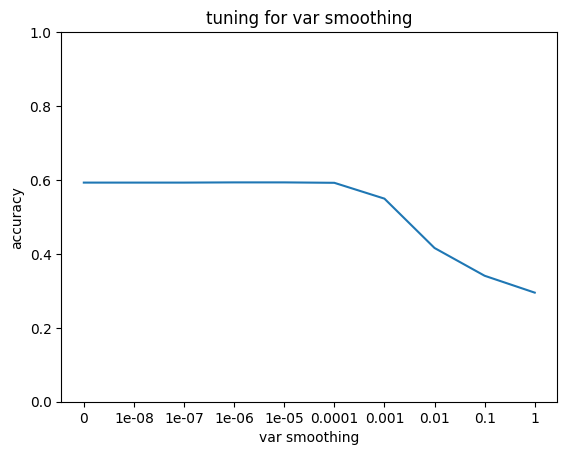

In [ ]:
# Graph of var smoothing
ls = map(str, sm)
plt.plot(list(ls),ac)
  
# naming the x axis
plt.xlabel('var smoothing')
# naming the y axis
plt.ylabel('accuracy')
  
# giving a title to my graph
plt.title('tuning for var smoothing')
plt.ylim(0,1)
  
# function to show the plot
plt.show()

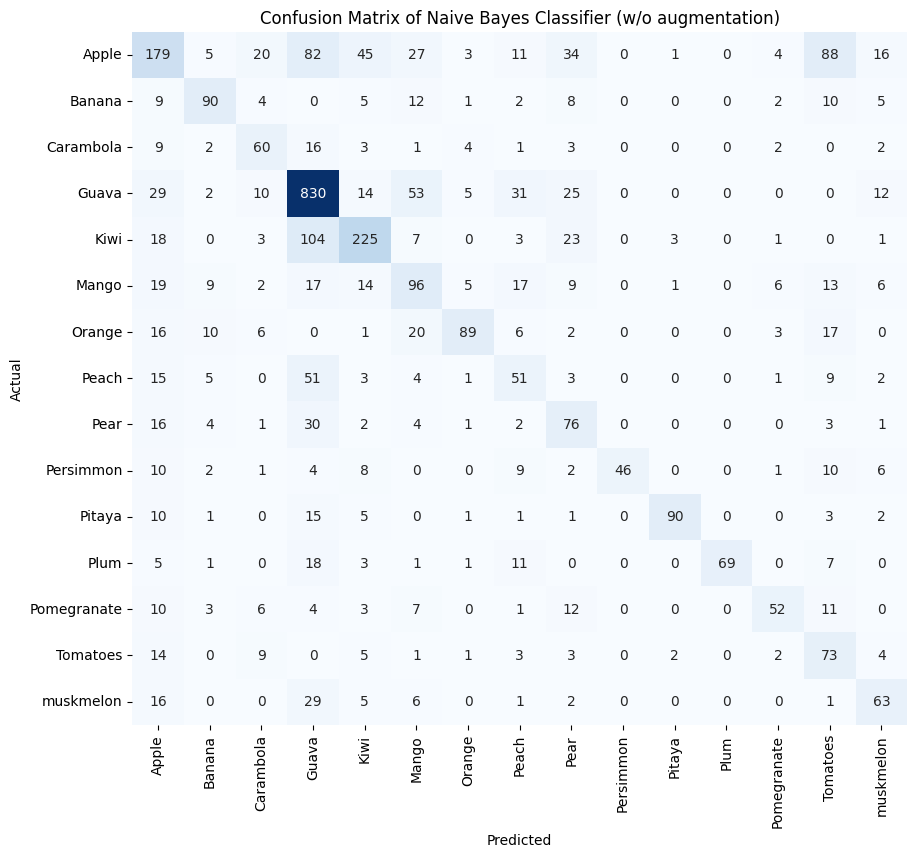

In [ ]:
# Confusion matrix of Gaussian Naive Bayes model
confusionMatrix = pd.DataFrame(confusion_matrix(Y_test, Ypred_test), columns=fruit_names, index = fruit_names)
confusionMatrix.index.name = 'Actual'
confusionMatrix.columns.name = 'Predicted'


plt.subplots(figsize=(10, 9))

sns.heatmap(confusionMatrix, cbar=False, annot=True, cmap="Blues", fmt='.0f')
plt.title('Confusion Matrix of Naive Bayes Classifier (w/o augmentation)')
plt.show()

In [ ]:
# Permance metrics of Gaussian Naive Bayes model
print("Performance Metrics:\n")
print(classification_report(Y_test, Ypred_test, target_names=fruit_names))

Performance Metrics:

              precision    recall  f1-score   support

       Apple       0.48      0.35      0.40       515
      Banana       0.67      0.61      0.64       148
   Carambola       0.49      0.58      0.53       103
       Guava       0.69      0.82      0.75      1011
        Kiwi       0.66      0.58      0.62       388
       Mango       0.40      0.45      0.42       214
      Orange       0.79      0.52      0.63       170
       Peach       0.34      0.35      0.35       145
        Pear       0.37      0.54      0.44       140
   Persimmon       1.00      0.46      0.63        99
      Pitaya       0.93      0.70      0.80       129
        Plum       1.00      0.59      0.75       116
 Pomegranate       0.70      0.48      0.57       109
    Tomatoes       0.30      0.62      0.40       117
   muskmelon       0.53      0.51      0.52       123

    accuracy                           0.59      3527
   macro avg       0.62      0.55      0.56      3527
weig

In [ ]:
# Written To make sample predictions
dataset2 = dataset.copy()
dataset2['pixel'] = dataset2['Filepath'].apply(img_to_array)


dataset2["label_id"] = dataset2["Type"].map(mapper_fruit_names)
dataset.head()
X = dataset2[['pixel', 'Filepath']] ######
Y = dataset2['label_id']
X_train2, X_val, Y_train2, Y_val = train_test_split(X, Y, train_size=0.8, stratify=Y, random_state=1)

# Test dataset
dataset_test = img_df.iloc[67013:70540]

dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)

X_test = dataset_test[['pixel', 'Filepath']]
Y_test = dataset_test['label']

<ipython-input-21-9b8f8dc00536>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)


In [ ]:
images = X_test['Filepath']
images = images.reset_index(drop=True)
X_train2 = X_train2.drop(['Filepath'], axis=1)
X_test = X_test.drop(['Filepath'], axis=1)

In [ ]:
# This line of code stacks the flattened pixel values of each image in the X_train DataFrame,
# so that they form a 2D array where each row represents an image and each column represents a pixel.
X_train2 = np.stack(X_train2['pixel']) ###
scaler = StandardScaler()
scaler.fit(X_train2)
X_train_norm2 = scaler.transform(X_train2)
X_test = scaler.transform(np.stack(X_test['pixel']))


pca = PCA(n_components=500)
pca.fit(X_train2)


PCA(n_components=500)

In [ ]:
Y_test = Y_test.reset_index(drop=True)
Y_test

0        3
1       11
2        0
3       14
4        5
        ..
3522     9
3523     3
3524     7
3525     3
3526    12
Name: label, Length: 3527, dtype: int64

In [ ]:
Y_test = np.array(Y_test)
Y_test
X_test = np.array(X_test)
X_test.shape

(3527, 7500)

In [ ]:
images = np.array(images)

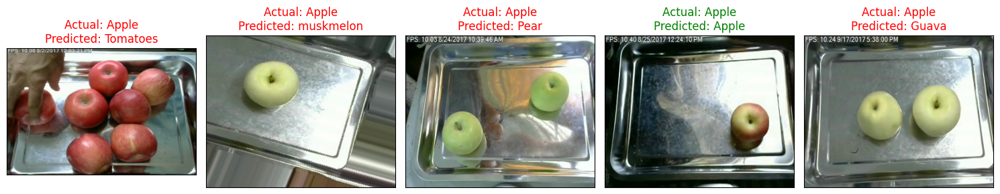

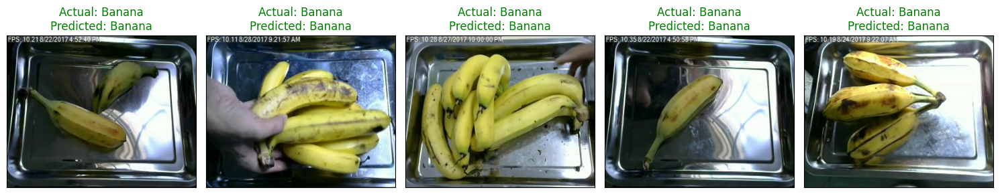

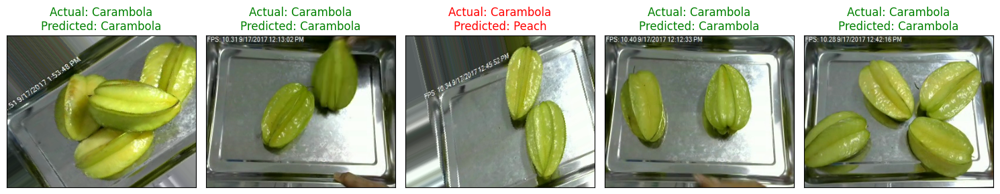

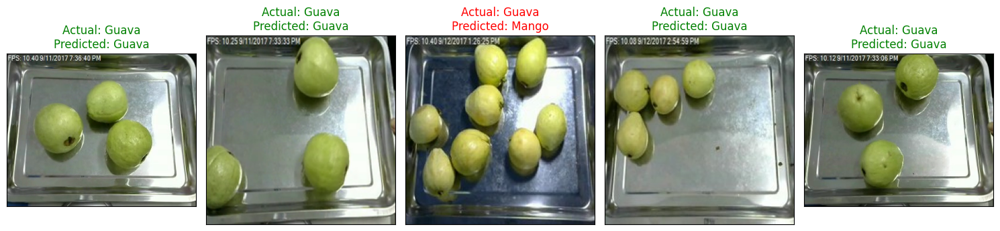

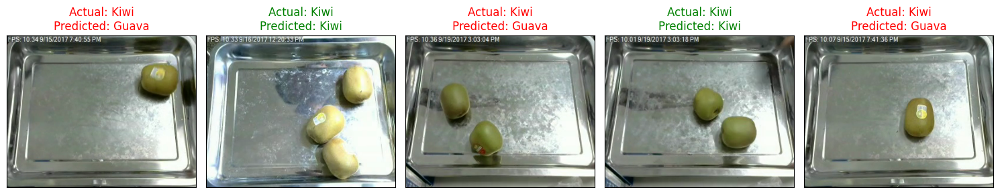

...

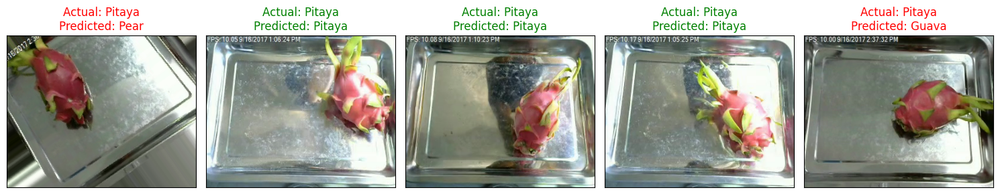

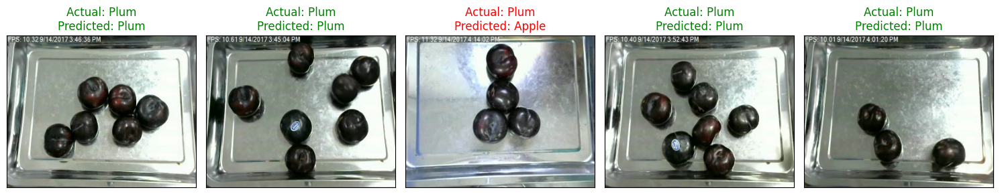

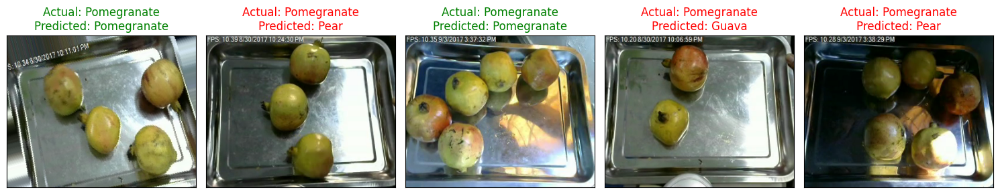

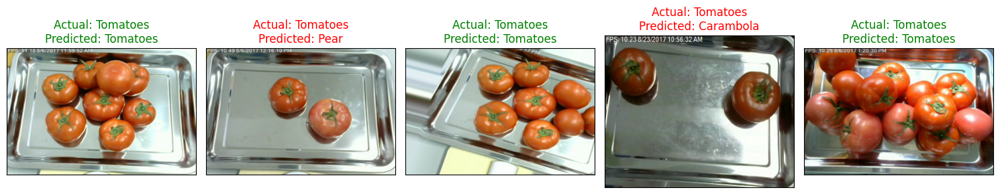

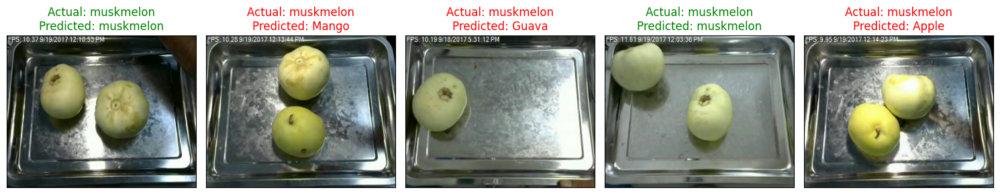

In [ ]:
# Sample Predictions
x = 0
currFruit = fruit_names[x]
fruit = set()

for visitFruit in fruit_names:
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), subplot_kw={'xticks': [], 'yticks': []})
  for i, ax in enumerate(axes.flat):
      for n in range(Y_test.size):
        if fruit_names[Y_test[-n]] is visitFruit and n not in fruit:
          fruit.add(n)
          img = cv.imread(images[-n])
          img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
          ax.imshow(img)
          #ax.imshow(images[-n])
          ax.set_title(f"Actual: {fruit_names[Y_test[-n]]}\nPredicted: {fruit_names[Ypred_test[-n]]}", color= "green" if fruit_names[Y_test[-n]] == fruit_names[Ypred_test[-n]] else "red" )
          break

  plt.tight_layout()
  plt.show()